In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

In [ ]:
img_height, img_width = 64, 64
batch_size = 50

train_ds = tf.keras.utils.image_dataset_from_directory(
    "/content/drive/MyDrive/465TINY/Train",
    image_size = (img_height, img_width),
    batch_size = batch_size
)
val_ds = tf.keras.utils.image_dataset_from_directory(
    "/content/drive/MyDrive/465TINY/Validation",
    image_size = (img_height, img_width),
    batch_size = batch_size
)
test_ds = tf.keras.utils.image_dataset_from_directory(
    "/content/drive/MyDrive/465TINY/Test",
    image_size = (img_height, img_width),
    batch_size = batch_size
)

Found 800 files belonging to 10 classes.
Found 100 files belonging to 10 classes.
Found 100 files belonging to 10 classes.


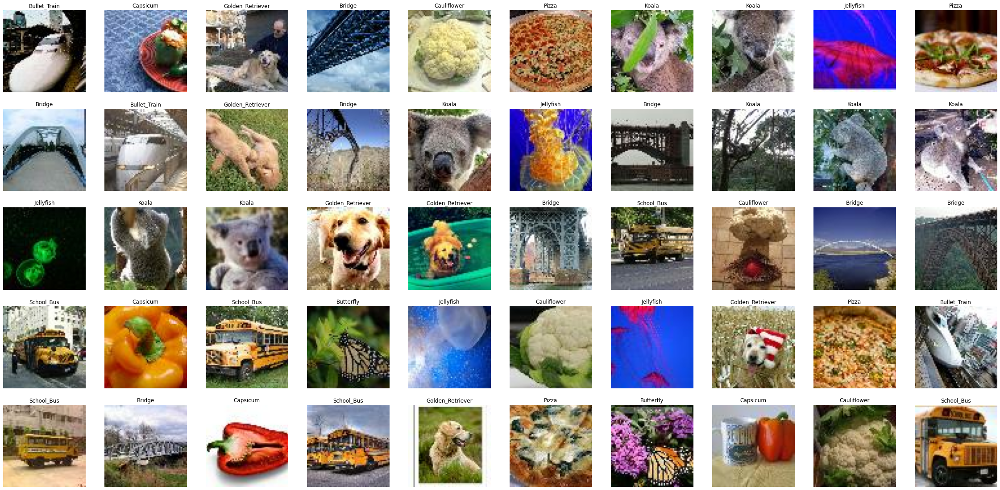

In [ ]:
class_names = ["Bridge", "Bullet_Train", "Butterfly","Capsicum", "Cauliflower", "Golden_Retriever","Jellyfish", "Koala", "Pizza", "School_Bus"]
plt.figure(figsize=(40,40))
for images, labels in train_ds.take(1):
  for i in range(50):
    ax = plt.subplot(10, 10, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

**CNN MODEL**

In [ ]:
model = tf.keras.Sequential(
    [
     tf.keras.layers.Rescaling(1./255),
     tf.keras.layers.Conv2D(50, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(64, 64, 3)),
     tf.keras.layers.Conv2D(75, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu'),
     tf.keras.layers.MaxPool2D(pool_size=(2,2)),
     tf.keras.layers.Dropout(0.25),
     tf.keras.layers.Conv2D(125, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu'),
     tf.keras.layers.MaxPool2D(pool_size=(2,2)),
     tf.keras.layers.Dropout(0.25),
     tf.keras.layers.Flatten(),
     tf.keras.layers.Dense(500, activation='relu'),
     tf.keras.layers.Dropout(0.4),
     tf.keras.layers.Dense(250, activation='relu'),
     tf.keras.layers.Dropout(0.2),
     tf.keras.layers.Dense(10,activation="softmax"),
    ]
)


In [ ]:
model.compile(
    optimizer="adam",
    loss=tf.losses.SparseCategoricalCrossentropy(from_logits = True),
    metrics=['accuracy']
)

In [ ]:
model.fit(
    train_ds,
    validation_data = val_ds,
    epochs = 20
)

Epoch 1/20
16/16 [==============================] - 2s 63ms/step - loss: 2.2295 - accuracy: 0.1663 - val_loss: 1.9165 - val_accuracy: 0.2700
Epoch 2/20
16/16 [==============================] - 1s 56ms/step - loss: 1.8591 - accuracy: 0.3325 - val_loss: 1.7269 - val_accuracy: 0.4600
Epoch 3/20
16/16 [==============================] - 1s 55ms/step - loss: 1.5956 - accuracy: 0.4038 - val_loss: 1.4818 - val_accuracy: 0.5300
Epoch 4/20
16/16 [==============================] - 1s 56ms/step - loss: 1.4149 - accuracy: 0.4875 - val_loss: 1.4540 - val_accuracy: 0.4600
Epoch 5/20
16/16 [==============================] - 1s 56ms/step - loss: 1.2361 - accuracy: 0.5550 - val_loss: 1.2572 - val_accuracy: 0.5300
Epoch 6/20
16/16 [==============================] - 1s 54ms/step - loss: 1.0399 - accuracy: 0.6338 - val_loss: 1.1296 - val_accuracy: 0.6300
Epoch 7/20
16/16 [==============================] - 1s 56ms/step - loss: 0.8298 - accuracy: 0.7325 - val_loss: 1.3938 - val_accuracy: 0.5200
Epoch 8/20
16

In [ ]:
model.evaluate(test_ds)

2/2 [==============================] - 0s 19ms/step - loss: 0.7578 - accuracy: 0.8200


[0.7578157782554626, 0.8199999928474426]

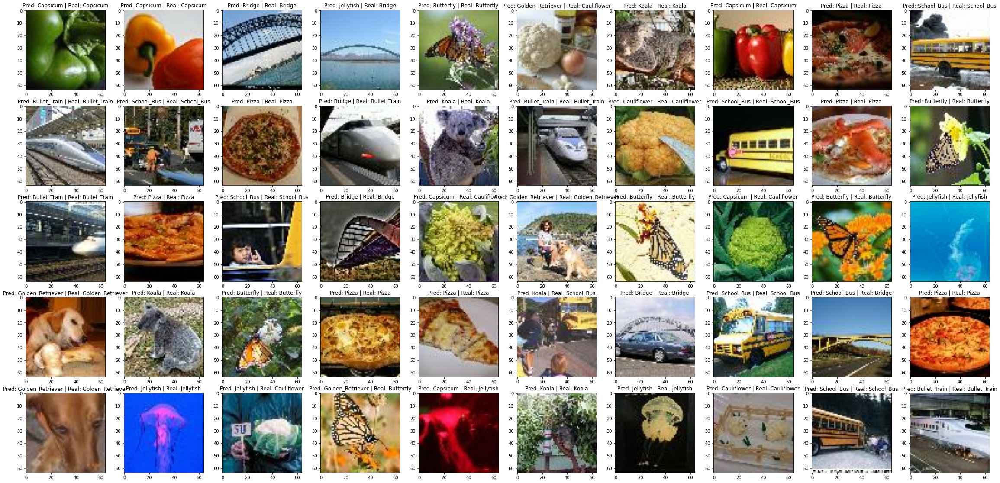

In [ ]:
import numpy

plt.figure(figsize=(40,40))
for images, labels in test_ds.take(1):
  classifications = model(images)
  
  for i in range(50):
    ax = plt.subplot(10, 10, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    index = numpy.argmax(classifications[i])
    plt.title("Pred: " + class_names[index] + " | Real: " + class_names[labels[i]])

**Feed-Forward MODEL**

In [ ]:
model = tf.keras.Sequential(
    [
     tf.keras.layers.Flatten(input_shape=(64,64,3)),
     tf.keras.layers.Dense(4096, activation='relu'),
     tf.keras.layers.Dense(2048, activation='relu'),
     tf.keras.layers.Dense(1024, activation='relu'),
     tf.keras.layers.Dense(512, activation='relu'),
     tf.keras.layers.Dense(256, activation='relu'),
     tf.keras.layers.Dense(10, activation='softmax')
    ]
)

In [ ]:
model.compile(
    optimizer="adam",
    loss=tf.losses.SparseCategoricalCrossentropy(from_logits = True),
    metrics=['accuracy']
)

In [ ]:
model.fit(
    train_ds,
    validation_data = val_ds,
    epochs = 20
)

Epoch 1/20
16/16 [==============================] - 1s 48ms/step - loss: 3266.4116 - accuracy: 0.1250 - val_loss: 678.5269 - val_accuracy: 0.1000
Epoch 2/20
16/16 [==============================] - 1s 42ms/step - loss: 284.9250 - accuracy: 0.1238 - val_loss: 60.4836 - val_accuracy: 0.1000
Epoch 3/20
16/16 [==============================] - 1s 40ms/step - loss: 28.7966 - accuracy: 0.2100 - val_loss: 9.8561 - val_accuracy: 0.2600
Epoch 4/20
16/16 [==============================] - 1s 39ms/step - loss: 5.4914 - accuracy: 0.2625 - val_loss: 3.5706 - val_accuracy: 0.2400
Epoch 5/20
16/16 [==============================] - 1s 38ms/step - loss: 2.7235 - accuracy: 0.3288 - val_loss: 2.8121 - val_accuracy: 0.3200
Epoch 6/20
16/16 [==============================] - 1s 39ms/step - loss: 1.8219 - accuracy: 0.3975 - val_loss: 1.9513 - val_accuracy: 0.2700
Epoch 7/20
16/16 [==============================] - 1s 40ms/step - loss: 1.5285 - accuracy: 0.4700 - val_loss: 1.8791 - val_accuracy: 0.3300
Epoc

In [ ]:
model.evaluate(test_ds)

2/2 [==============================] - 0s 8ms/step - loss: 1.7593 - accuracy: 0.5200


[1.7593226432800293, 0.5199999809265137]

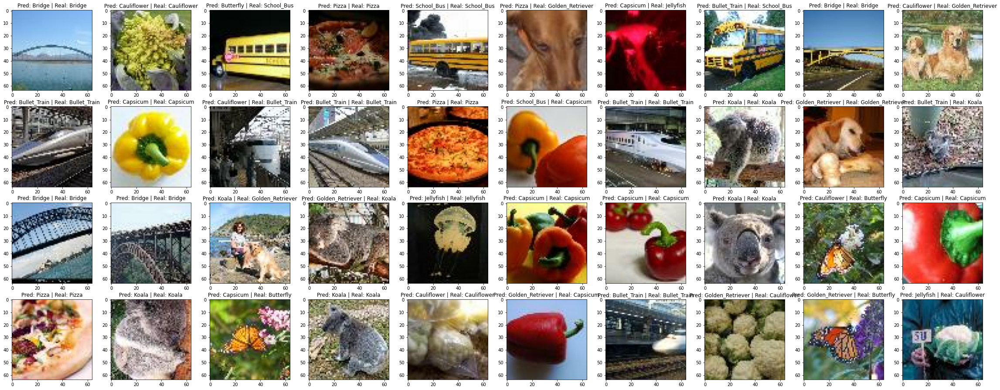

In [ ]:
import numpy

plt.figure(figsize=(40,40))
for images, labels in test_ds.take(1):
  classifications = model(images)
  
  for i in range(40):
    ax = plt.subplot(10, 10, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    index = numpy.argmax(classifications[i])
    plt.title("Pred: " + class_names[index] + " | Real: " + class_names[labels[i]])